# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [1]:
from utils import get_dataset

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import PIL as Image
import seaborn as sns
import pandas as pd
import glob
import tensorflow as tf
%matplotlib inline

In [3]:
dataset = get_dataset("data/preprocessed_data/*tfrecord")

INFO:tensorflow:Reading unweighted datasets: ['data/preprocessed_data/*tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['data/preprocessed_data/*tfrecord']
INFO:tensorflow:Number of filenames to read: 100
Instructions for updating:
Use `tf.data.Dataset.interleave(map_func, cycle_length, block_length, num_parallel_calls=tf.data.AUTOTUNE)` instead. If sloppy execution is desired, use `tf.data.Options.experimental_deterministic`.
Instructions for updating:
Use `tf.data.Dataset.map()


## Familiarize myself with data structure and its attributes

In [4]:
# dataset type: it is tensorflow DatasetV1Adapter
type(dataset) 

tensorflow.python.data.ops.dataset_ops.DatasetV1Adapter

In [5]:
# dataset attributes
dir(dataset)

['_GeneratorState',
 '__abstractmethods__',
 '__bool__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__len__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__nonzero__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__slots__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_abc_impl',
 '_add_variable_with_custom_getter',
 '_apply_debug_options',
 '_as_serialized_graph',
 '_as_variant_tensor',
 '_checkpoint_dependencies',
 '_consumers',
 '_dataset',
 '_deferred_dependencies',
 '_flat_shapes',
 '_flat_structure',
 '_flat_types',
 '_functions',
 '_gather_saveables_for_checkpoint',
 '_graph',
 '_graph_attr',
 '_handle_deferred_dependencies',
 '_inputs',
 '_list_extra_dependencies_for_serialization',
 '_list_functions_for_serialization',
 '_lookup_dependency',
 '_make_initializable_it

In [6]:
# one element of the dataset
dataset.take(1)

<DatasetV1Adapter shapes: {image: (None, None, 3), source_id: (), key: (), filename: (), groundtruth_image_confidences: (None,), groundtruth_verified_neg_classes: (None,), groundtruth_not_exhaustive_classes: (None,), groundtruth_boxes: (None, 4), groundtruth_area: (None,), groundtruth_is_crowd: (None,), groundtruth_difficult: (None,), groundtruth_group_of: (None,), groundtruth_weights: (None,), groundtruth_classes: (None,), groundtruth_image_classes: (None,), original_image_spatial_shape: (2,)}, types: {image: tf.uint8, source_id: tf.string, key: tf.string, filename: tf.string, groundtruth_image_confidences: tf.float32, groundtruth_verified_neg_classes: tf.int64, groundtruth_not_exhaustive_classes: tf.int64, groundtruth_boxes: tf.float32, groundtruth_area: tf.float32, groundtruth_is_crowd: tf.bool, groundtruth_difficult: tf.int64, groundtruth_group_of: tf.bool, groundtruth_weights: tf.float32, groundtruth_classes: tf.int64, groundtruth_image_classes: tf.int64, original_image_spatial_sh

In [7]:
# Each element is like a dictionary with the following keys
type(dataset.take(1).get_single_element())

dict

In [8]:
# Keys of the dictionary
list(dataset.take(1))[0].keys()

dict_keys(['image', 'source_id', 'key', 'filename', 'groundtruth_image_confidences', 'groundtruth_verified_neg_classes', 'groundtruth_not_exhaustive_classes', 'groundtruth_boxes', 'groundtruth_area', 'groundtruth_is_crowd', 'groundtruth_difficult', 'groundtruth_group_of', 'groundtruth_weights', 'groundtruth_classes', 'groundtruth_image_classes', 'original_image_spatial_shape'])

In [9]:
#shape of each element and its components
dataset.output_shapes  # or we can use: dataset.element_spec

Instructions for updating:
Use `tf.compat.v1.data.get_output_shapes(dataset)`.


{'image': TensorShape([None, None, 3]),
 'source_id': TensorShape([]),
 'key': TensorShape([]),
 'filename': TensorShape([]),
 'groundtruth_image_confidences': TensorShape([None]),
 'groundtruth_verified_neg_classes': TensorShape([None]),
 'groundtruth_not_exhaustive_classes': TensorShape([None]),
 'groundtruth_boxes': TensorShape([None, 4]),
 'groundtruth_area': TensorShape([None]),
 'groundtruth_is_crowd': TensorShape([None]),
 'groundtruth_difficult': TensorShape([None]),
 'groundtruth_group_of': TensorShape([None]),
 'groundtruth_weights': TensorShape([None]),
 'groundtruth_classes': TensorShape([None]),
 'groundtruth_image_classes': TensorShape([None]),
 'original_image_spatial_shape': TensorShape([2])}

In [389]:
# For example: groundtruth classes of one element of the dataset
# 1: vehicle, 2: pedestrian, 4: cyclist
list(dataset.take(1))[0]['groundtruth_classes'] #dataset.take(1).get_single_element()['groundtruth_classes']


<tf.Tensor: shape=(13,), dtype=int64, numpy=array([1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1], dtype=int64)>

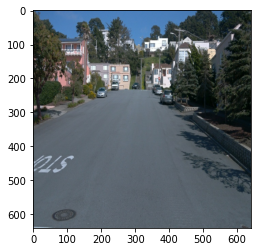

In [12]:
# Showing a sample image from dataset
img = dataset.take(1).get_single_element()['image']
plt.imshow(img)

In [13]:
dataset.take(1).get_single_element()['filename'].numpy()

b'segment-11379226583756500423_6230_810_6250_810_with_camera_labels_70.tfrecord'

## Write a function to display an image and the bounding boxes

Implement the `display_instances` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [4]:
def display_instances(batch):
    """
    This function takes a batch from the dataset and display the image with 
    the associated bounding boxes.
    """
    # ADD CODE HERE

    img = batch['image']
    Height = batch["original_image_spatial_shape"].numpy()[0]
    Width = batch["original_image_spatial_shape"].numpy()[1]
    
    Boxes = batch['groundtruth_boxes'].numpy() # [[y1, x1, y2, x2]]
    
    Boxes[:, [0, 2]] = Boxes[:, [0, 2]]*Height
    Boxes[:, [1, 3]] = Boxes[:, [1, 3]]*Width
    
    Classes = batch['groundtruth_classes'].numpy()
    
    class_color = {1: 'red', 2: 'blue', 4: 'green'} # vehicles in red, pedestrians in blue, cyclist in green
    class_label = {1: 'vehicle', 2:'pedestrian', 4:'cyclist'}
    
    dpi_res = plt.rcParams['figure.dpi']
    fig, ax = plt.subplots(figsize = (Width/dpi_res, Height/dpi_res))
    ax.imshow(img)
    
    for bb, cl in zip(Boxes, Classes):
        y1 = bb[0]
        x1 = bb[1]
        y2 = bb[2]
        x2 = bb[3]
        
        bb_width = x2 - x1
        bb_height = y2 - y1
        
        ax.add_patch(Rectangle((x1, y1), bb_width, bb_height, 
                     linewidth=2, edgecolor=class_color[cl], fill=False))
        
        ax.text(x1, y1, class_label[cl], color=class_color[cl], fontsize='medium')
    
    plt.tight_layout()    
    plt.show()
    

## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

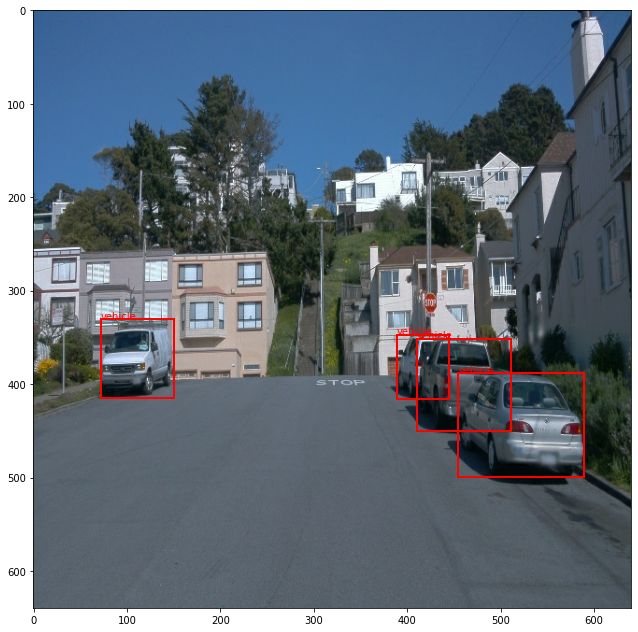

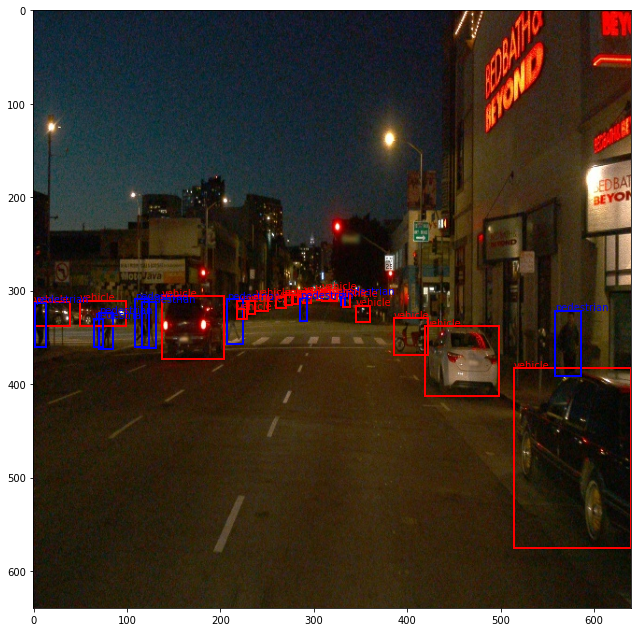

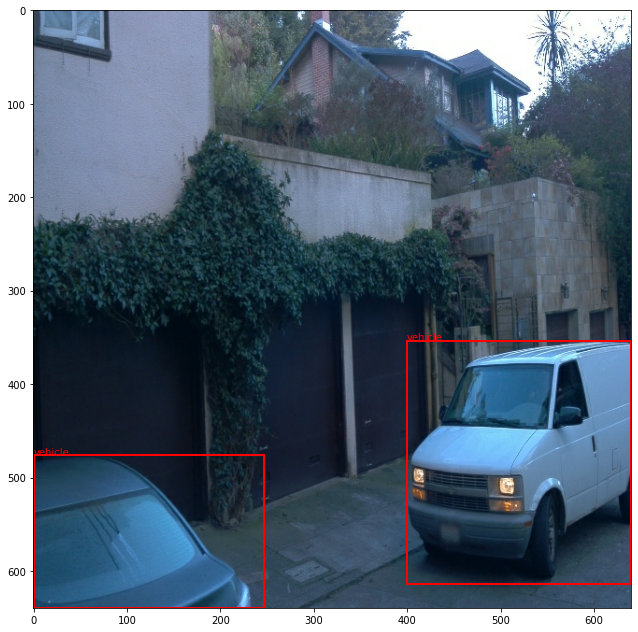

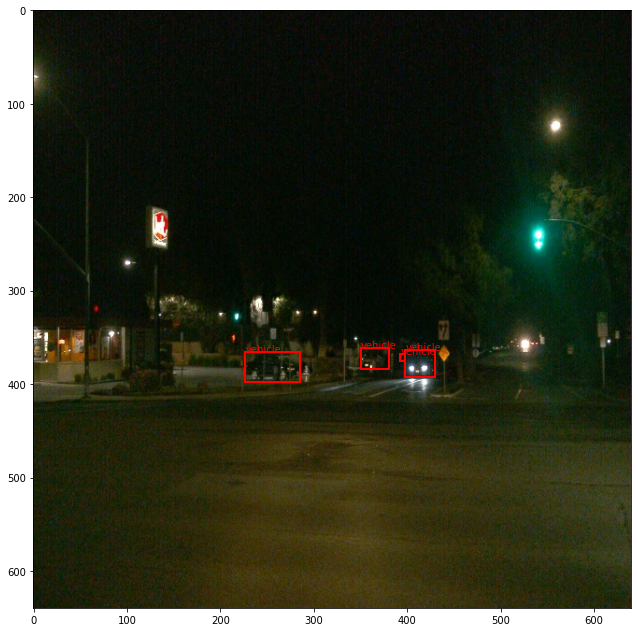

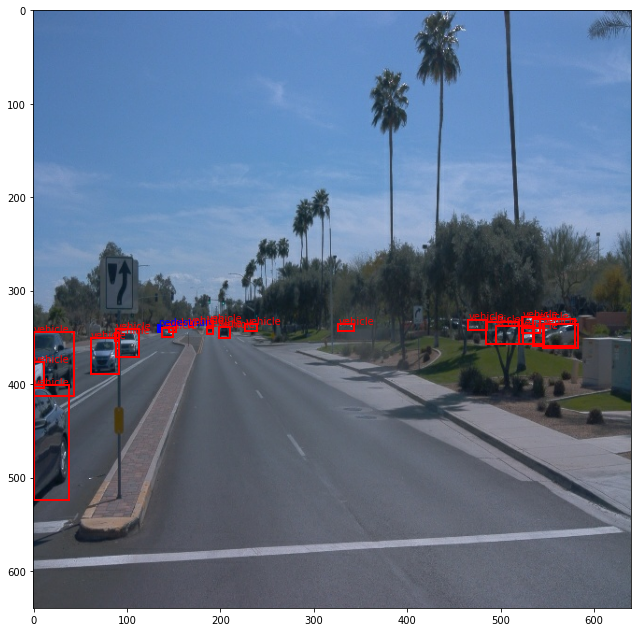

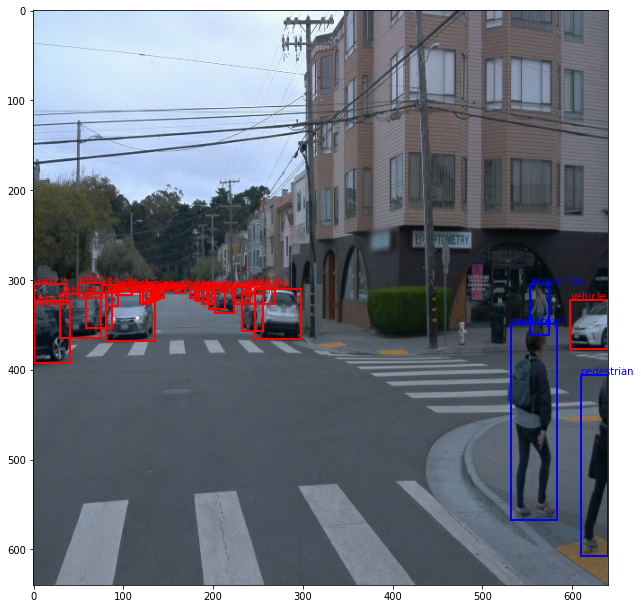

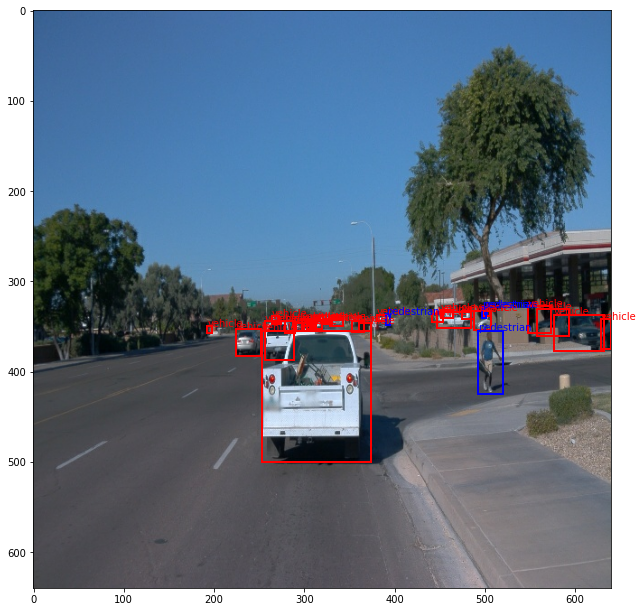

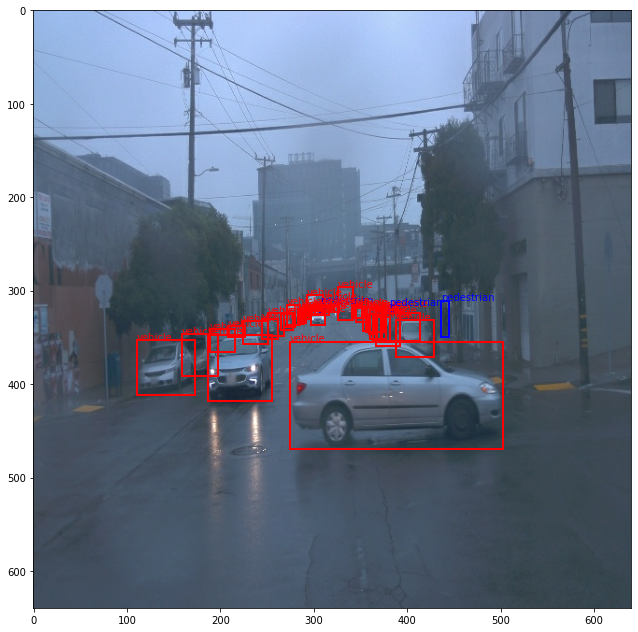

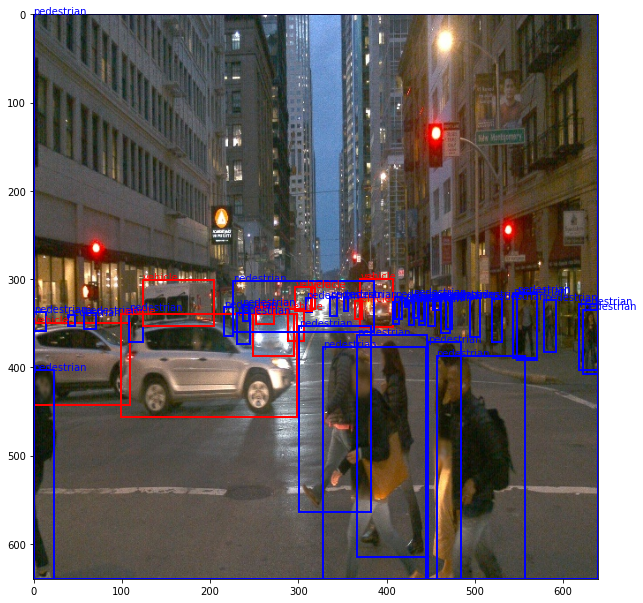

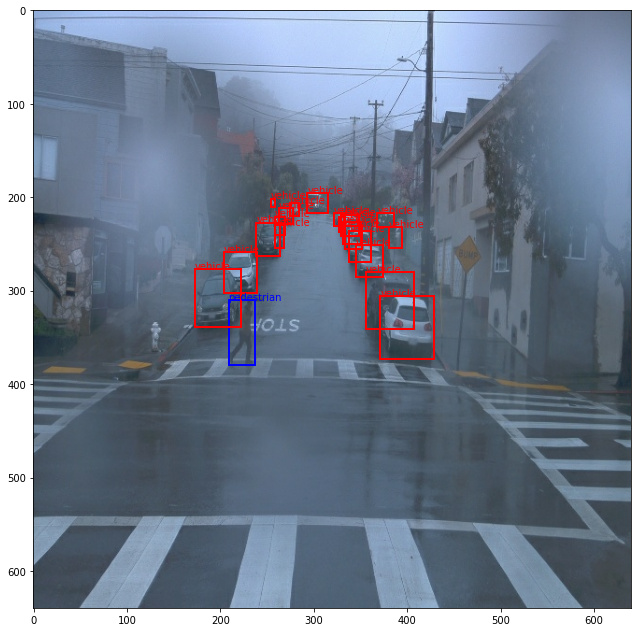

In [77]:
## STUDENT SOLUTION HERE
batch_of_data = dataset.shuffle(buffer_size=1000, seed=None, reshuffle_each_iteration=True).take(10)

for element in batch_of_data:
    
    display_instances(element)

## Additional EDA

In this last part, you are free to perform any additional analysis of the dataset. What else would like to know about the data?
For example, think about data distribution. So far, you have only looked at a single file...

## Number of images in Dataset
We need to know how many elements we have in our dataset

In [ ]:
num_elements = dataset.reduce(np.int64(0), lambda x, _: x+1).numpy()

## Statistics Function
This function take an element (image) of the dataset and return a Pandas DataFrame including filename, classes associated with bounding boxes, relative area of the bounding boxes w.r.t. the image area, the area of the bounding boxes

In [16]:
def statistics_of_image(element):
    # Input: one element (image) of the dataset
    # Output: a Pandas DataFrame showing statistics of bounding boxes of the input image
    
    Height = element['original_image_spatial_shape'].numpy()[0]
    Width = element['original_image_spatial_shape'].numpy()[1]
    
    Boxes = element['groundtruth_boxes'].numpy()
    Classes = element['groundtruth_classes'].numpy()
    Label = {1: 'vehicle', 2: 'pedestrian', 4: 'cyclist'}
    FileName = element['filename'].numpy()
    
    Boxes[:, [0, 2]] = Boxes[:, [0, 2]]*Height
    Boxes[:, [1, 3]] = Boxes[:, [1, 3]]*Width
    
    bb_relative_area = []
    bb_area = []
    bb_class = []
    
    
    for bb, cl in zip(Boxes, Classes):
        
        y1 = bb[0]
        x1 = bb[1]
        y2 = bb[2]
        x2 = bb[3]
        
        bb_relative_area.append( (x2 - x1)*(y2 - y1) / (Width * Height) ) # Relative area of BB w.r.t. image
        bb_area.append( (x2 - x1)*(y2 - y1) ) # BB area
        bb_class.append(Label[cl]) # class of the BB
    
    Data = {'File_Name':FileName, 'BB_Class':bb_class, 'BB_Relative_Area': bb_relative_area, 'BB_Area': bb_area}
    
    df = pd.DataFrame(Data)
    
    return df
                                     

## Statistics of the Dataset
This section runs the `statistics_of_image` function on all elements (images) in the dataset and return a Panadas DataFrame (`DF`) including statistics

In [17]:
batch = dataset.shuffle(buffer_size=1000, seed=None, reshuffle_each_iteration=True).take(1000)
DF = pd.DataFrame(columns=['File_Name', 'BB_Class', 'BB_Relative_Area', 'BB_Area', 'Image_ID'])

for indx, element in enumerate(batch):
    df = statistics_of_image(element)
    df['Image_ID'] = np.ones(shape=(df.shape[0],1))*indx
    
    DF = pd.concat([DF, df], axis=0)

In [18]:
# first 5 rows of the DataFrame
DF.head(5)

,File_Name,BB_Class,BB_Relative_Area,BB_Area,Image_ID
0,b'segment-10526338824408452410_5714_660_5734_6...,vehicle,0.000259,106.242439,0.0
1,b'segment-10526338824408452410_5714_660_5734_6...,vehicle,0.000438,179.507645,0.0
2,b'segment-10526338824408452410_5714_660_5734_6...,vehicle,0.005292,2167.655029,0.0
3,b'segment-10526338824408452410_5714_660_5734_6...,vehicle,0.000767,314.303802,0.0
4,b'segment-10526338824408452410_5714_660_5734_6...,vehicle,0.000064,26.327684,0.0


## Visualization of Statistics
In this section, I investigated the distribution of the classes in the dataset using the statistic DataFrame `DF`

### Count of Classes
The figure below shows the count of each class (`vehicle`, `pedestrian`, `cyclist`) in the dataset. Most of the bounding boxes in the dataset are labeled as `vehicle`. Bounding boxes labeled as `pedestrian` are less than one-third of those labeled as `vehicle`. There are very few bounding boxes labeled as `cyclist`.
**Therefore:**
- The classes are not balanced
- The model could have difficulty identifying `cyclisits` compared to `vehicles` or `pedestrians`


<AxesSubplot:xlabel='BB_Class', ylabel='count'>

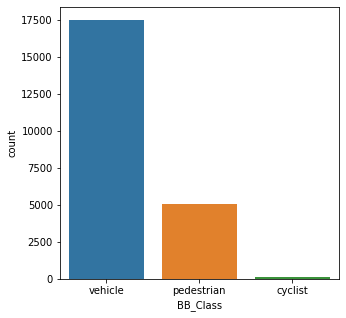

In [19]:
plt.figure(figsize=(5, 5))
sns.countplot(x='BB_Class', data=DF)

### Relative and Absolute Area of the Bounding Boxes
The figure below shows the relative and absolute area of the bounding boxes for each class (`vehicle`, `pedestrian`, `cyclist`) in the dataset. 

- The `boxplot` below shows that there are outliers. These outliers represent those objects that were too close to the cameras. For instance, a relative area of 1 for `pedestrian` bounding box shows that the corresponding image contains only one object.


<AxesSubplot:xlabel='BB_Class', ylabel='BB_Area'>

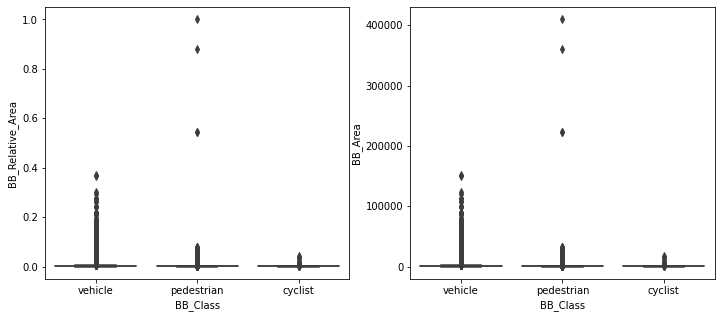

In [20]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))
sns.boxplot(x="BB_Class", y="BB_Relative_Area", data=DF, showfliers=True, ax=axes[0])
sns.boxplot(x="BB_Class", y="BB_Area", data=DF, showfliers=True, ax=axes[1])


- **without outliers**: To have a better understanding,  the `boxplot` below shows the relative and absolute areas after removing outliers. This plot shows that bounding boxes oftentimes occupy a small portion of an image for all three classes  (`vehicle`, `pedestrian`, `cyclist`) 

<AxesSubplot:xlabel='BB_Class', ylabel='BB_Area'>

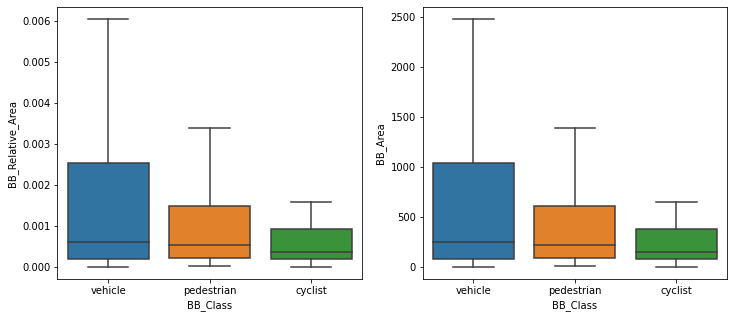

In [21]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))
sns.boxplot(x="BB_Class", y="BB_Relative_Area", data=DF, showfliers=False, ax=axes[0])
sns.boxplot(x="BB_Class", y="BB_Area", data=DF, showfliers=False, ax=axes[1])

- The `stripplot` below shows that those images with large bounding boxes are very few and most of the dataset contain images that have small bounding boxes for all classes.

<AxesSubplot:xlabel='BB_Class', ylabel='BB_Relative_Area'>

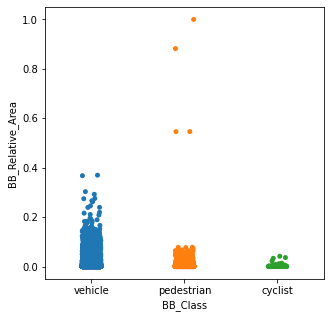

In [22]:
plt.figure(figsize=(5, 5))
sns.stripplot(x="BB_Class", y="BB_Relative_Area", data=DF)


### Distribution of Classes
The `barplot` below shows:
- Most of the images either contain both `vehicle` and `pedestrian` classes or only `vehicle`.
- Images containing all three classes (`vehicle`, `pedestrian`, `cyclist`) are small portion of the dataset.
- There are very few images containing only `cyclist`, only `pedestrian`, and both `cyclist` and `vehicle`.

Text(0, 0.5, 'Class Count')

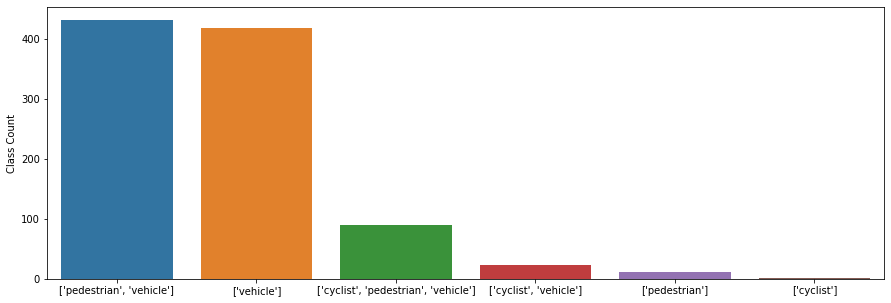

In [70]:
plt.figure(figsize=(15,5))
classes_in_images = DF.groupby('Image_ID')['BB_Class'].unique().apply(lambda x: str(sorted(x))).value_counts()
sns.barplot(x=classes_in_images.index, y=classes_in_images)
plt.ylabel('Class Count')

### Number of each class per image (Class Frequency)
The DataFrame `df_class_freq` shows the number of each class per each image. The `stripplot` shows that:
- `vehicle`: between 0 and ~70 times per image
- `pedestrian`: between 0 and ~45 times per image
- `cyclist`: between  0 and ~5 times per image

In [30]:
class_freq = DF.groupby('Image_ID')['BB_Class'].value_counts()
class_freq.name='Class_Freq'
df_class_freq = class_freq.reset_index(level=1)
df_class_freq 

,BB_Class,Class_Freq
Image_ID,,
0.0,vehicle,16
1.0,vehicle,59
1.0,pedestrian,8
2.0,vehicle,1
3.0,vehicle,34
...,...,...
995.0,vehicle,2
996.0,vehicle,13
998.0,vehicle,14


<AxesSubplot:xlabel='BB_Class', ylabel='Class_Freq'>

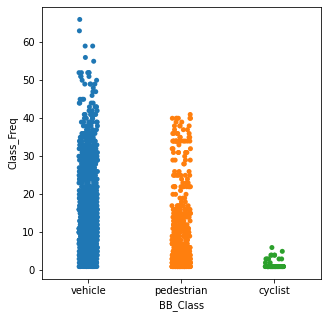

In [31]:
plt.figure(figsize=(5,5))
sns.stripplot(x="BB_Class", y="Class_Freq", data=df_class_freq)

### Weather, light, traffic conditions in a sample batch
Taking samples shows that even in a small batch of data (10 images) we can have different `weather` conditions (e.g., sunny/cloudy), different `light` conditions (e.g., day/night), and different `traffic` conditions (e.g., crowded, non-crowded streets)

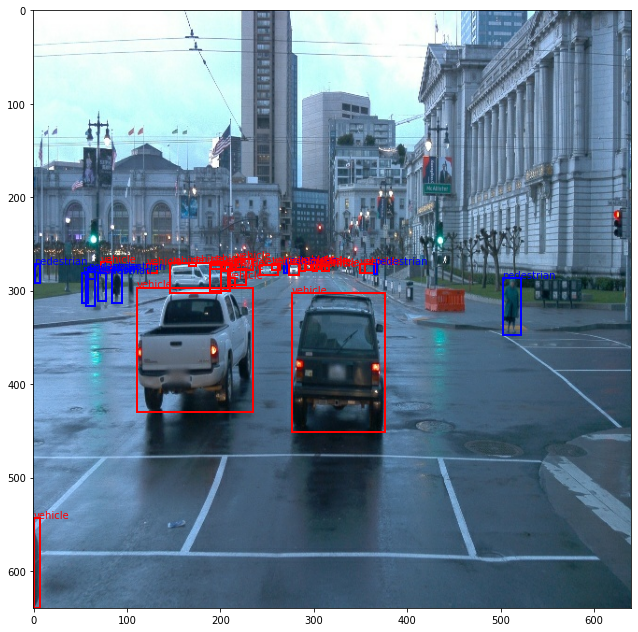

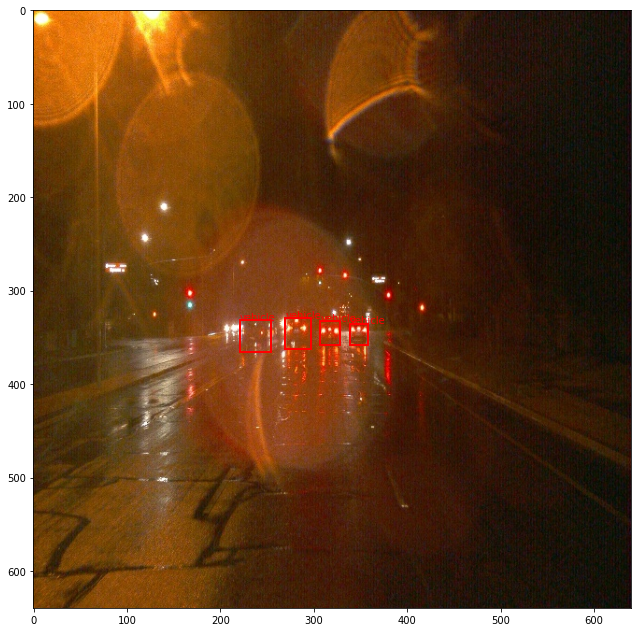

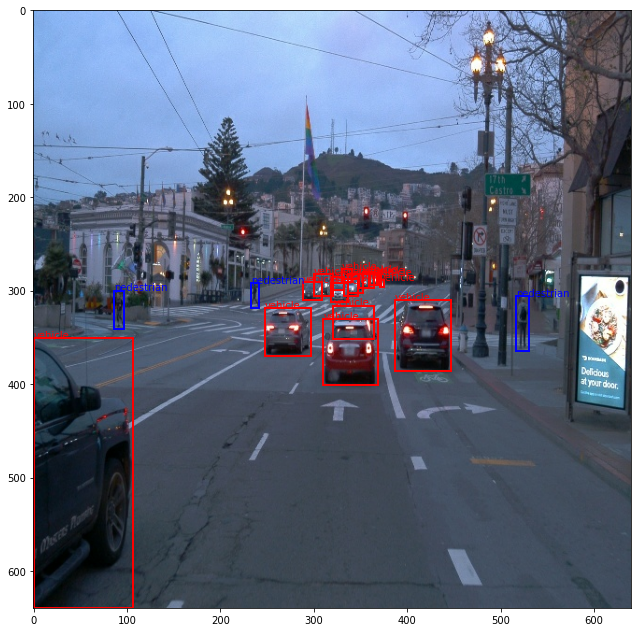

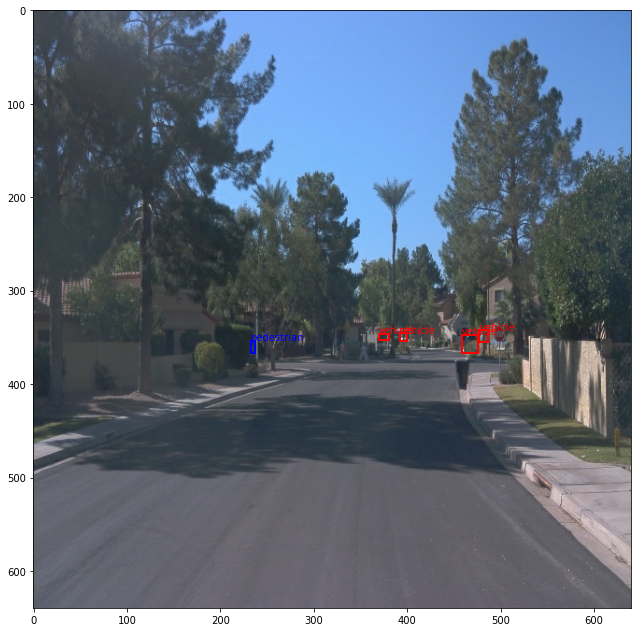

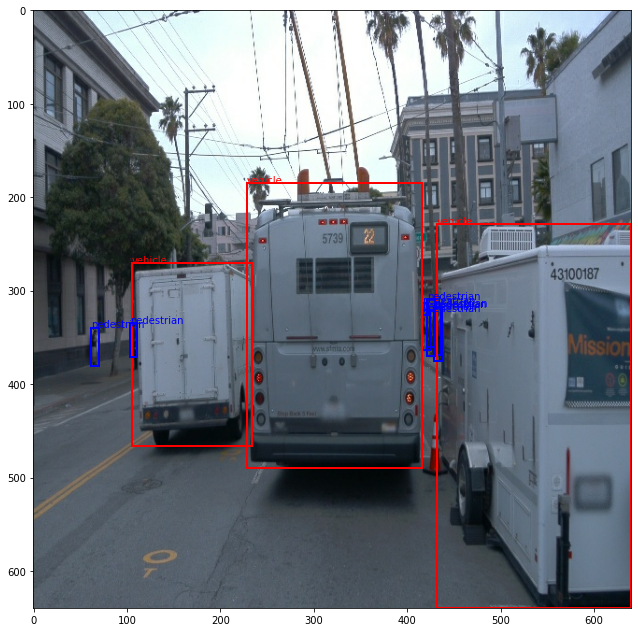

In [78]:
sample_batch = dataset.take(5)
for element in sample_batch:
    display_instances(element)